In [1]:
!nvidia-smi

Mon Feb  3 21:45:50 2025       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 537.70                 Driver Version: 537.70       CUDA Version: 12.2     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                     TCC/WDDM  | Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp   Perf          Pwr:Usage/Cap |         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Quadro P6000                 WDDM  | 00000000:03:00.0  On |                 ERR! |
| 54%   82C    P0              95W / 250W |  19067MiB / 24576MiB |    100%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [2]:
import torch
%matplotlib inline

#device = 'cuda:0'
device = 'cuda:1'
device = device if torch.cuda.is_available() else 'cpu'
device

'cuda:1'

# 1. Create Datasets

In [3]:
train_folder_path = r'dfc25_track1_trainval\train'
val_folder_path = r'dfc25_track1_trainval\train'
test_folder_path = r'dfc25_track1_trainval\train'

In [4]:
import os
import numpy as np
from PIL import Image
from torch.utils.data import Dataset

class SegmentationDataset(Dataset):
    def __init__(self, folder_path, transforms=None):
        self.folder_path = folder_path
        self.transforms = transforms
        
        self.sar_folder_path = os.path.join(folder_path, 'sar_images')
        self.rgb_folder_path = os.path.join(folder_path, 'rgb_images')
        
        self.sar_files = sorted(os.listdir(self.sar_folder_path))
        self.rgb_files = sorted(os.listdir(self.rgb_folder_path))
        
        # Image cache
        self.image_cache = {}

    def __len__(self):
        return len(self.sar_files)
    
    def read_img(self, path):
        """Reads and caches an image."""
        if path not in self.image_cache:
            img = np.array(Image.open(path))
            self.image_cache[path] = img
        return self.image_cache[path]
    
    def __getitem__(self, idx):
        sar_path = os.path.join(self.sar_folder_path, self.sar_files[idx])
        rgb_path = os.path.join(self.rgb_folder_path, self.rgb_files[idx])
        
        sar = self.read_img(sar_path)[:, :, np.newaxis]  # Ensure channel dimension
        rgb = self.read_img(rgb_path)
        
        if self.transforms:
            sar_rgb = np.concatenate([sar, rgb], axis=2)
            results = self.transforms(image=sar_rgb)
            image = results['image']
            sar = image[:1, :, :]
            rgb = image[1:, :, :]
        
        return sar, rgb

In [5]:
import albumentations as A
from albumentations.pytorch import ToTensorV2

mean = (0.19407524985160743,  # SAR
        0.4919135824150882, 0.5065469988267931, 0.4547521695503487) # RGB
std = (0.11998196523095886, # SAR
       0.15089740680957267, 0.12776688363324923, 0.12191884548626808) # RGB

# SAR channels should use original statistics, RGB should be scaled to [-1,1]
mean = (0.19407524985160743,  # Keep original SAR mean
        0.5, 0.5, 0.5)        # RGB means set to 0.5

std = (0.11998196523095886,   # Keep original SAR std
       0.5, 0.5, 0.5)         # RGB stds set to 0.5

size = (128, 128)
train_transforms = A.Compose([
    A.Resize(*size),
    A.Normalize(mean=mean, std=std),
    ToTensorV2()
])

val_transforms = A.Compose([
    A.Resize(*size),
    A.Normalize(mean=mean, std=std),
    ToTensorV2()
])

test_transforms = A.Compose([
    A.Resize(*size),
    A.Normalize(mean=mean, std=std),
    ToTensorV2()
])

def denormalize_sar(sar):
    return sar * std[0] + mean[0]

def denormalize_rgb(rgb):
    # shape: (3, 512, 512)
    return rgb * torch.tensor(std[1:]).view(3, 1, 1) + torch.tensor(mean[1:]).view(3, 1, 1)

C:\Users\U-III\.conda\envs\torch_env\lib\site-packages\torchvision\io\image.py:13: UserWarning: Failed to load image Python extension: '[WinError 127] The specified procedure could not be found'If you don't plan on using image functionality from `torchvision.io`, you can ignore this warning. Otherwise, there might be something wrong with your environment. Did you have `libjpeg` or `libpng` installed before building `torchvision` from source?
  warn(


In [6]:
train_dataset = SegmentationDataset(train_folder_path, transforms=train_transforms)
len(train_dataset)

4333

In [7]:
a, b = train_dataset[17]
a.shape, b.shape, a.mean(dim=(1, 2)), b.mean(dim=(1, 2)), a.std(dim=(1, 2)), b.std(dim=(1, 2))

(torch.Size([1, 128, 128]),
 torch.Size([3, 128, 128]),
 tensor([-0.1104]),
 tensor([ 0.3300,  0.1523, -0.0565]),
 tensor([0.7214]),
 tensor([0.1021, 0.1183, 0.1125]))

# 1.1. Visualize Dataset

In [8]:
import matplotlib.pyplot as plt

def plot_image_and_mask(sar, rgb):
    fig, ax = plt.subplots(1, 2, figsize=(10, 5))
    sar_norm = denormalize_sar(sar).squeeze()
    rgb_norm = denormalize_rgb(rgb).permute(1, 2, 0)
    ax[0].imshow(sar_norm, cmap='gray')
    ax[1].imshow(rgb_norm)
    ax[0].axis('off')
    ax[1].axis('off')
    plt.show()

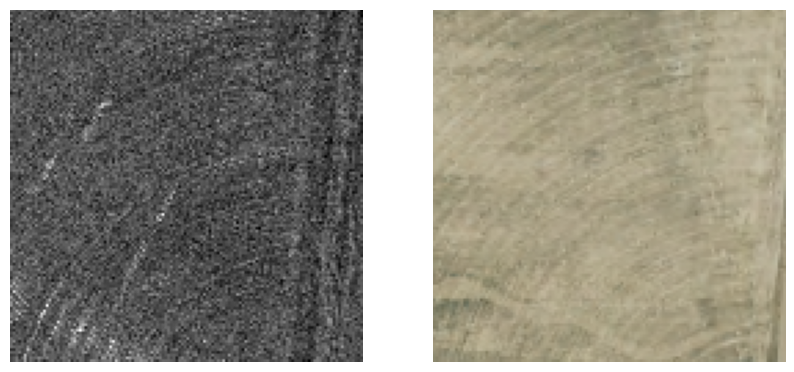

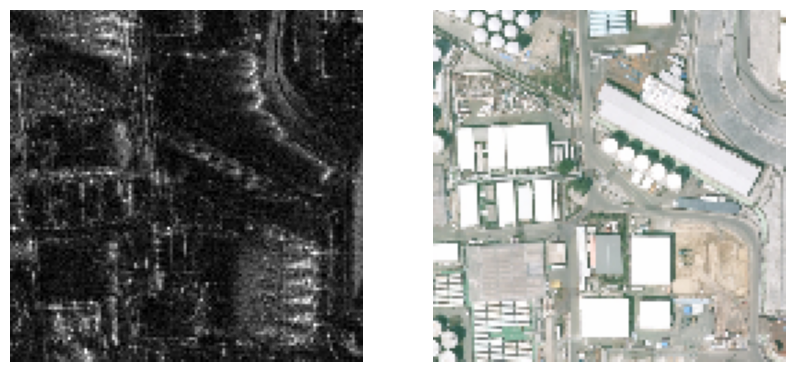

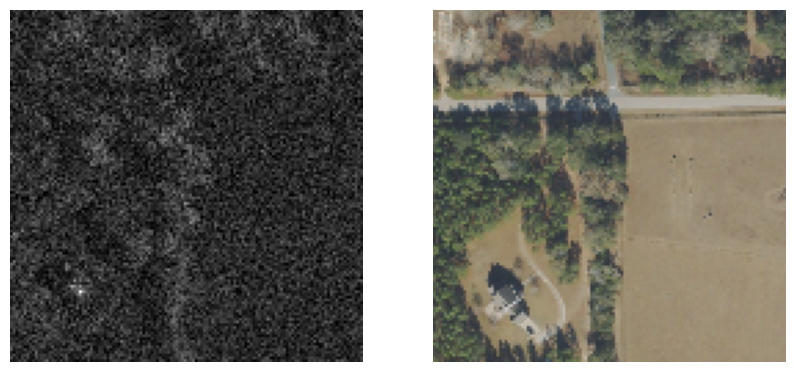

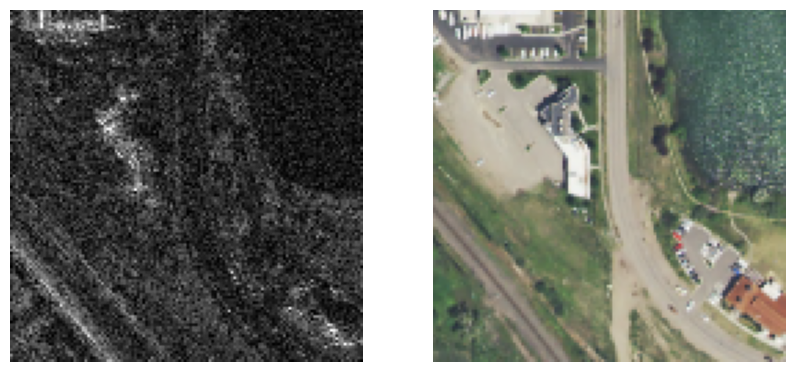

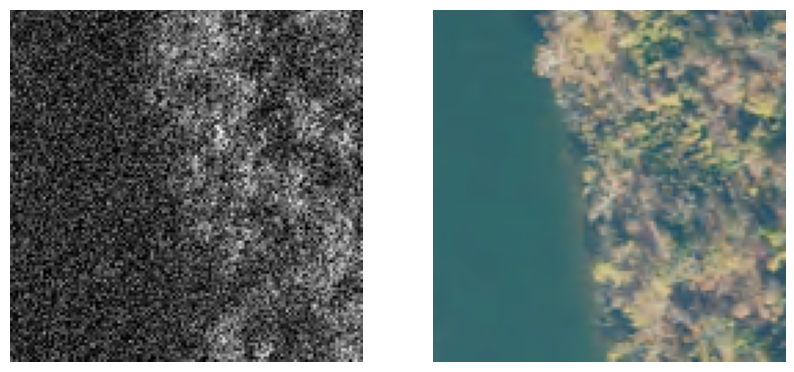

In [9]:
for i in range(5):
    random_idx = np.random.randint(0, len(train_dataset))
    sar, rgb = train_dataset[i]
    plot_image_and_mask(sar, rgb)

# 2. Creating Model

In [13]:
import torch
import torch.nn as nn
import torch.nn.functional as F

class ResidualBlock(nn.Module):
    """Residual block with two convolutional layers and batch normalization."""
    def __init__(self, in_channels):
        super(ResidualBlock, self).__init__()
        self.conv1 = nn.Conv2d(in_channels, in_channels, kernel_size=3, padding=1)
        self.bn1 = nn.BatchNorm2d(in_channels)
        self.conv2 = nn.Conv2d(in_channels, in_channels, kernel_size=3, padding=1)
        self.bn2 = nn.BatchNorm2d(in_channels)

    def forward(self, x):
        residual = x
        out = F.relu(self.bn1(self.conv1(x)))
        out = self.bn2(self.conv2(out))
        out += residual
        return F.relu(out)

class ConditionalVAE_v2(nn.Module):
    def __init__(self, latent_dim=1024, img_size=128):
        super(ConditionalVAE_v2, self).__init__()
        self.latent_dim = latent_dim
        self.img_size = img_size
        self.feature_map_size = img_size // 8  # 16 for img_size=128

        # Enhanced Encoder with residual blocks
        self.enc_conv = nn.Sequential(
            nn.Conv2d(4, 64, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            ResidualBlock(64),
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            ResidualBlock(128),
            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            ResidualBlock(256),
        )

        # Latent space projection
        self.fc_mu = nn.Linear(256 * self.feature_map_size**2, latent_dim)
        self.fc_logvar = nn.Linear(256 * self.feature_map_size**2, latent_dim)

        # Deeper SAR encoder with residual blocks
        self.cond_enc = nn.Sequential(
            nn.Conv2d(1, 64, kernel_size=4, stride=2, padding=1),
            nn.ReLU(),
            ResidualBlock(64),
            nn.Conv2d(64, 128, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            ResidualBlock(128),
            nn.Conv2d(128, 256, kernel_size=4, stride=2, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            ResidualBlock(256),
        )

        # Latent to feature projection
        self.fc_z_to_feat = nn.Linear(latent_dim, 256 * self.feature_map_size**2)

        # Enhanced Decoder with upsampling and residual blocks
        self.dec_conv = nn.Sequential(
            # Initial 512 channels (256 cond + 256 z)
            nn.Upsample(scale_factor=2, mode='bilinear', align_corners=False),
            nn.Conv2d(512, 512, kernel_size=3, padding=1),
            nn.BatchNorm2d(512),
            nn.ReLU(),
            ResidualBlock(512),
            
            nn.Upsample(scale_factor=2, mode='bilinear', align_corners=False),
            nn.Conv2d(512, 256, kernel_size=3, padding=1),
            nn.BatchNorm2d(256),
            nn.ReLU(),
            ResidualBlock(256),
            
            nn.Upsample(scale_factor=2, mode='bilinear', align_corners=False),
            nn.Conv2d(256, 128, kernel_size=3, padding=1),
            nn.BatchNorm2d(128),
            nn.ReLU(),
            ResidualBlock(128),
            
            # Final refinement layers
            nn.Conv2d(128, 64, kernel_size=3, padding=1),
            nn.BatchNorm2d(64),
            nn.ReLU(),
            nn.Conv2d(64, 32, kernel_size=3, padding=1),
            nn.BatchNorm2d(32),
            nn.ReLU(),
            nn.Conv2d(32, 3, kernel_size=3, padding=1),
            nn.Tanh(),
        )

    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std

    def forward(self, sar, rgb=None):
        if self.training:
            encoder_input = torch.cat([sar, rgb], dim=1)
            enc_out = self.enc_conv(encoder_input)
            enc_out_flat = enc_out.view(enc_out.size(0), -1)
            mu = self.fc_mu(enc_out_flat)
            logvar = self.fc_logvar(enc_out_flat)
            z = self.reparameterize(mu, logvar)
        else:
            mu, logvar = None, None
            z = torch.randn(sar.size(0), self.latent_dim, device=sar.device)

        # Process SAR condition
        cond_feat = self.cond_enc(sar)
        
        # Project latent vector
        z_feat = self.fc_z_to_feat(z)
        z_feat = z_feat.view(-1, 256, self.feature_map_size, self.feature_map_size)
        
        # Concatenate and decode
        dec_input = torch.cat([cond_feat, z_feat], dim=1)
        recon_rgb = self.dec_conv(dec_input)
        
        return recon_rgb, mu, logvar
        
latent_dim = 2048
img_size = 128
model = ConditionalVAE_v2(latent_dim=latent_dim, img_size=img_size).to(device)

# 3. Train Model

In [14]:
def test_step(model, sar, rgb, show_plot=True, epoch=None):
    """
    Performs the forward pass of the cVAE model during evaluation.
    
    Args:
        model: The cVAE model.
        sar: SAR images [B, 1, H, W].
        rgb: Target RGB images [B, 3, H, W].
        
    Returns:
        recon_rgb: The reconstructed RGB images.
    """
    model.eval()
    with torch.no_grad():
        recon_rgb, mu, logvar = model(sar)
    recon_rgb_norm = denormalize_rgb(recon_rgb.cpu())
    if show_plot:
        plt.figure(figsize=(10, 5))
        plt.subplot(1, 3, 1)
        plt.axis('off')
        plt.title('SAR' + (' (Epoch {})'.format(epoch) if epoch!=None else ''))
        plt.imshow(denormalize_sar(sar.cpu()).squeeze(), cmap='gray')

        plt.subplot(1, 3, 2)
        plt.axis('off')
        plt.title('Reconstructed RGB' + (' (Epoch {})'.format(epoch) if epoch!=None else ''))
        plt.imshow(recon_rgb_norm.squeeze().permute(1, 2, 0))

        plt.subplot(1, 3, 3)
        plt.axis('off')
        plt.title('Target RGB' + (' (Epoch {})'.format(epoch) if epoch!=None else ''))
        plt.imshow(denormalize_rgb(rgb.cpu()).squeeze().permute(1, 2, 0))

        plt.show()

    return recon_rgb_norm
# test_step(model, a.unsqueeze(0).to(device))

In [15]:
def train_step(model, optimizer, sar, rgb, beta=1.0):
    """
    Performs one training step (forward + backward pass) for the cVAE.
    
    Args:
        model: The cVAE model.
        optimizer: The optimizer (e.g., RMSprop, SGD with momentum, etc.).
        sar: SAR images [B, 1, H, W].
        rgb: Target RGB images [B, 3, H, W].
        beta: Weighting factor for the KL divergence term.
        
    Returns:
        total_loss: The total loss (reconstruction + beta * KL).
        recon_loss: The reconstruction loss value.
        kl_loss: The KL divergence loss value.
    """
    model.train()
    optimizer.zero_grad()
    
    # Forward pass: during training both SAR and RGB are provided.
    recon_rgb, mu, logvar = model(sar, rgb)
    
    # --- Reconstruction Loss ---
    # Here we use MSELoss assuming our RGB outputs are scaled (e.g., normalized to [-1, 1])
    # If your images are in [0, 1] and you use a Sigmoid output, consider using BCE.
    recon_loss = F.mse_loss(recon_rgb, rgb, reduction='mean')
    
    # --- KL Divergence Loss ---
    # The KL divergence between the learned latent distribution N(mu, sigma^2)
    # and the standard normal N(0,1) can be computed as follows:
    # Note: We average the KL loss per batch item.
    kl_loss = -0.5 * torch.mean(torch.sum(1 + logvar - mu.pow(2) - logvar.exp(), dim=1))
    
    # --- Total Loss ---
    total_loss = recon_loss + beta * kl_loss
    
    # Backward pass and optimization step.
    total_loss.backward()
    optimizer.step()
    
    return total_loss.item(), recon_loss.item(), kl_loss.item()

In [16]:
from tqdm import tqdm
import numpy as np  # Make sure to import numpy if not already

def train(model, train_loader, optimizer, num_epochs=10, beta=1.0):
    # Select a random sample from the training dataset for visualization
    random_idx = np.random.randint(0, len(train_dataset))
    random_sar, random_rgb = train_dataset[random_idx]
    random_sar = random_sar.unsqueeze(0).to(device)
    
    # Initial test step before training
    test_step(model, random_sar, random_rgb, show_plot=True, epoch=0)
    
    for epoch in range(num_epochs):
        epoch_loss = 0
        epoch_recon_loss = 0
        epoch_kl_loss = 0
        
        # Wrap the train_loader with tqdm and provide a description
        pbar = tqdm(train_loader, desc=f"Epoch {epoch+1}", unit="batch")
        for sar_batch, rgb_batch in pbar:
            sar_batch = sar_batch.to(device)
            rgb_batch = rgb_batch.to(device)
            
            # Perform a training step and get the losses
            total_loss, recon_loss, kl_loss = train_step(model, optimizer, sar_batch, rgb_batch, beta=beta)
            
            # Accumulate the losses for later reporting
            epoch_loss += total_loss
            epoch_recon_loss += recon_loss
            epoch_kl_loss += kl_loss
            
            # Update the tqdm progress bar with the current batch's total loss.
            # If total_loss is a tensor, convert it to a Python float using .item()
            pbar.set_postfix(total_loss=total_loss)
        
        pbar.close()
        # Print the average losses for the epoch
        print(f"Epoch {epoch+1} | Loss: {epoch_loss/len(train_loader):.4f} | "
              f"Recon Loss: {epoch_recon_loss/len(train_loader):.4f} | "
              f"KL Loss: {epoch_kl_loss/len(train_loader):.4f}")
        
        # Perform a test step after the epoch
        test_step(model, random_sar, random_rgb, show_plot=True, epoch=epoch+1)


In [17]:
from datetime import datetime

BATCH_SIZE = 64
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)

lr = 1e-4
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
epochs = 10
beta=0.25
# best_model_path = f'unetplusplus_resnet50_ce_adamw_lr{lr:.0e}_bs{BATCH_SIZE}_512_noaug-{datetime.now().strftime("%Y_%m_%d")}.pth'

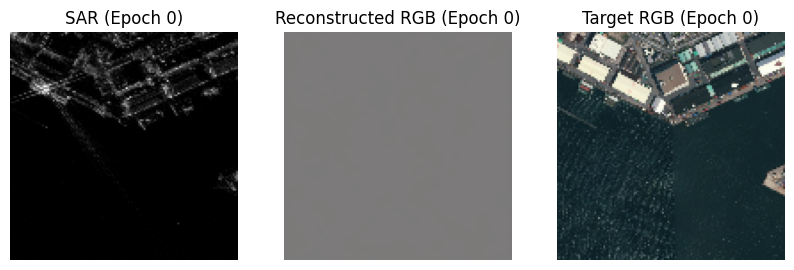

Epoch 1: 100%|█████████████████████████████████████████████████████| 68/68 [03:55<00:00,  3.47s/batch, total_loss=99.3]


Epoch 1 | Loss: 613.9467 | Recon Loss: 0.1337 | KL Loss: 2455.2520


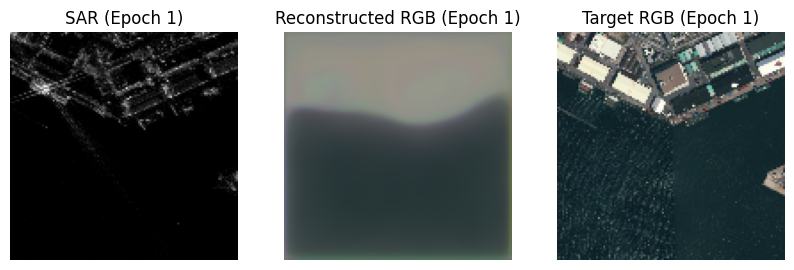

Epoch 2: 100%|█████████████████████████████████████████████████████| 68/68 [02:12<00:00,  1.95s/batch, total_loss=8.59]


Epoch 2 | Loss: 34.5334 | Recon Loss: 0.1248 | KL Loss: 137.6344


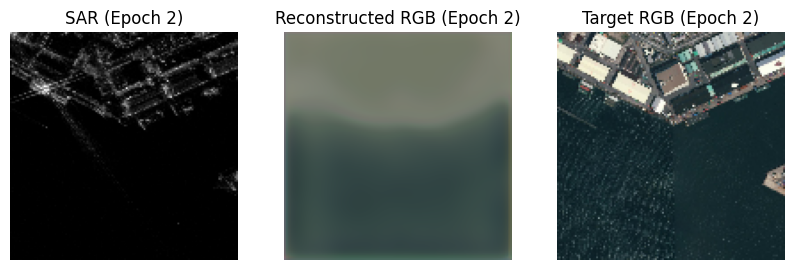

Epoch 3: 100%|█████████████████████████████████████████████████████| 68/68 [02:10<00:00,  1.92s/batch, total_loss=5.31]


Epoch 3 | Loss: 8.6118 | Recon Loss: 0.1202 | KL Loss: 33.9665


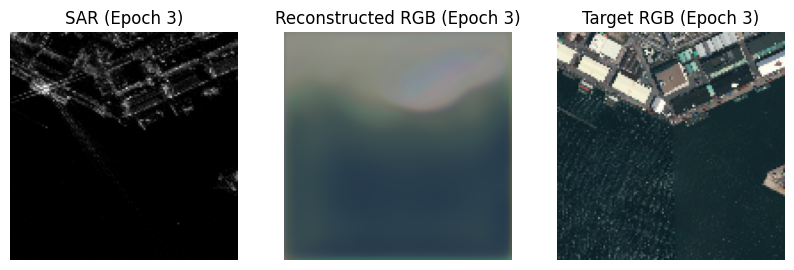

Epoch 4: 100%|█████████████████████████████████████████████████████| 68/68 [02:09<00:00,  1.90s/batch, total_loss=1.95]


Epoch 4 | Loss: 3.0373 | Recon Loss: 0.1184 | KL Loss: 11.6755


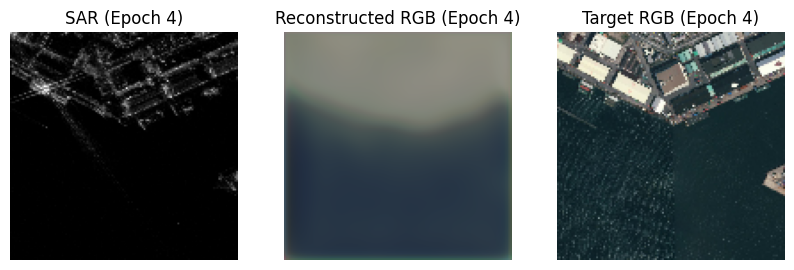

Epoch 5: 100%|█████████████████████████████████████████████████████| 68/68 [02:09<00:00,  1.91s/batch, total_loss=1.68]


Epoch 5 | Loss: 2.1183 | Recon Loss: 0.1138 | KL Loss: 8.0180


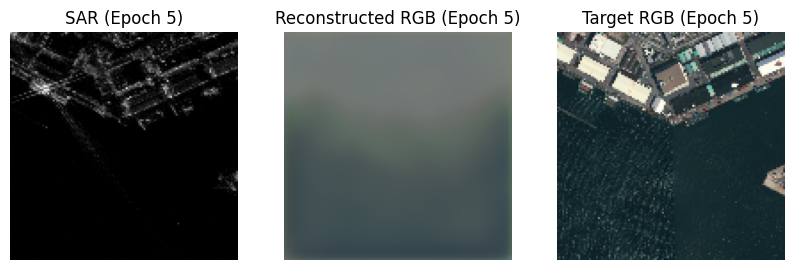

Epoch 6: 100%|█████████████████████████████████████████████████████| 68/68 [02:10<00:00,  1.92s/batch, total_loss=1.92]


Epoch 6 | Loss: 1.6925 | Recon Loss: 0.1089 | KL Loss: 6.3345


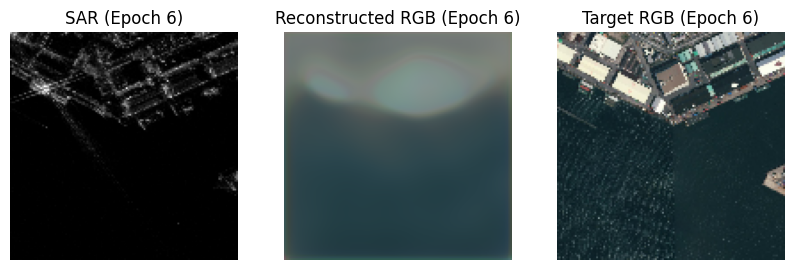

Epoch 7: 100%|█████████████████████████████████████████████████████| 68/68 [02:09<00:00,  1.90s/batch, total_loss=1.26]


Epoch 7 | Loss: 1.3907 | Recon Loss: 0.1022 | KL Loss: 5.1542


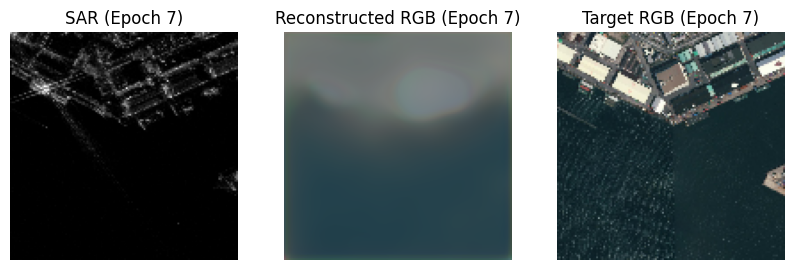

Epoch 8: 100%|█████████████████████████████████████████████████████| 68/68 [02:07<00:00,  1.87s/batch, total_loss=1.33]


Epoch 8 | Loss: 1.0158 | Recon Loss: 0.0944 | KL Loss: 3.6855


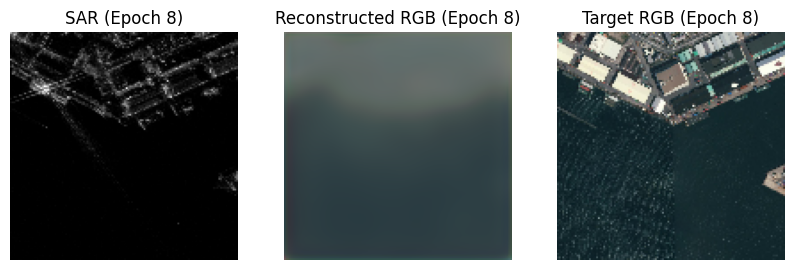

Epoch 9: 100%|████████████████████████████████████████████████████| 68/68 [02:06<00:00,  1.86s/batch, total_loss=0.723]


Epoch 9 | Loss: 0.8429 | Recon Loss: 0.0868 | KL Loss: 3.0242


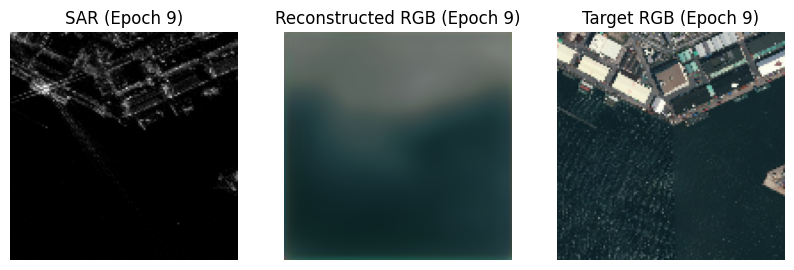

Epoch 10: 100%|███████████████████████████████████████████████████| 68/68 [02:09<00:00,  1.90s/batch, total_loss=0.862]


Epoch 10 | Loss: 0.7437 | Recon Loss: 0.0829 | KL Loss: 2.6434


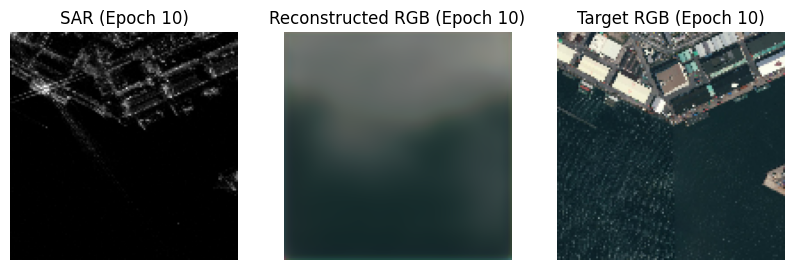

In [18]:
train(model, train_loader, optimizer, num_epochs=10, beta=beta)

# 4. Visualize Results

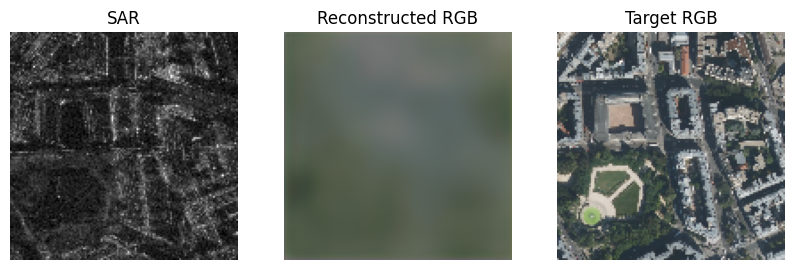

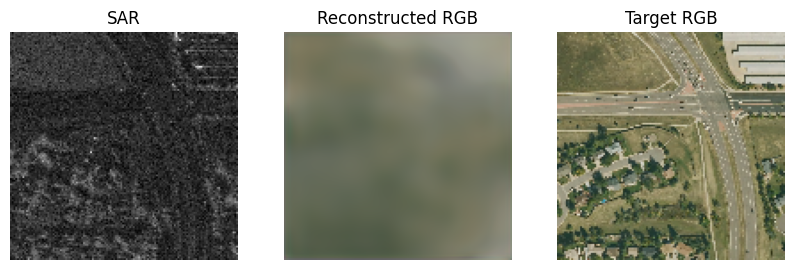

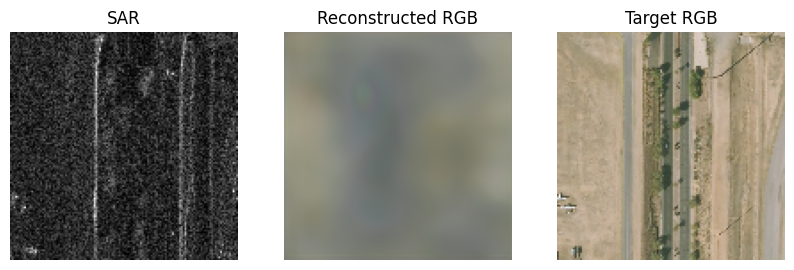

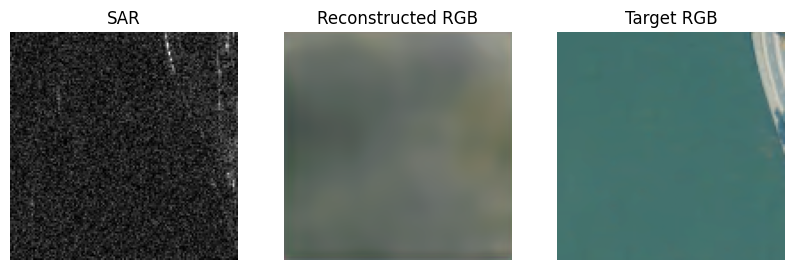

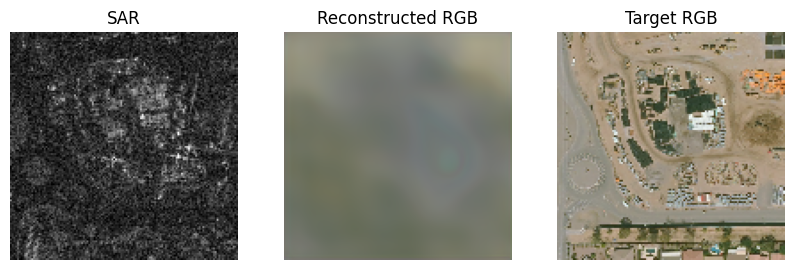

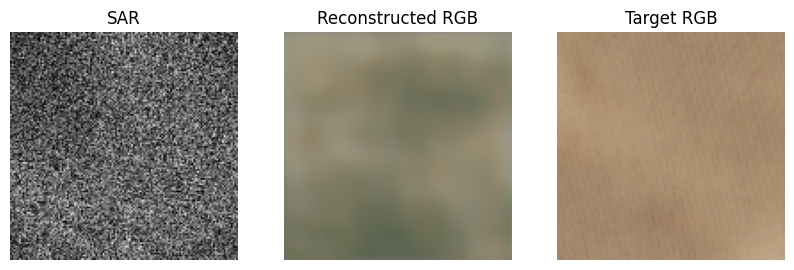

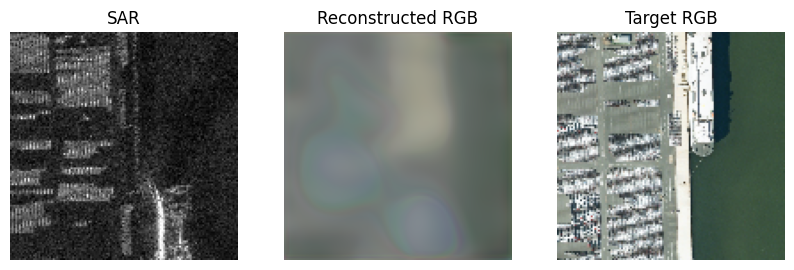

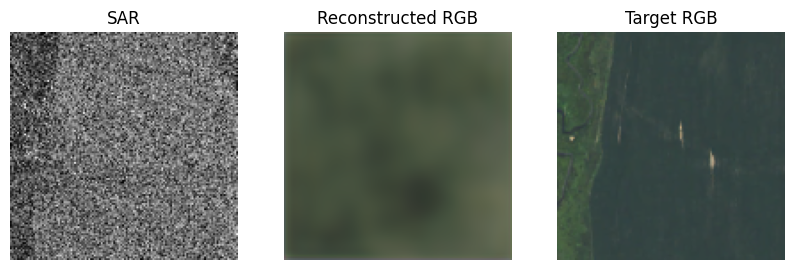

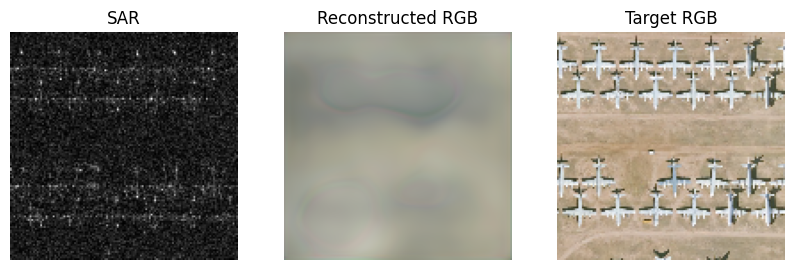

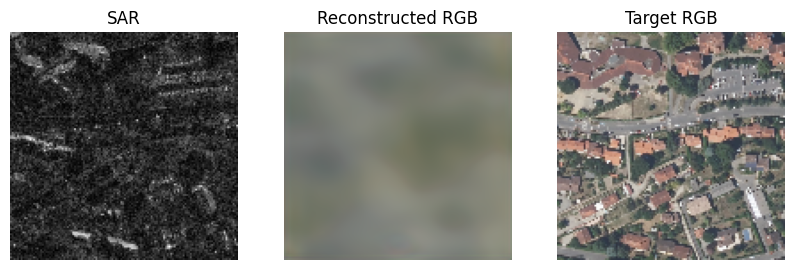

In [20]:
for i in range(10):
    random_idx = np.random.randint(0, len(train_dataset))
    random_sar, random_rgb = train_dataset[random_idx]
    random_sar = random_sar.unsqueeze(0).to(device)
    
    # Initial test step before training
    test_step(model, random_sar, random_rgb, show_plot=True)

# 5. Predict on Test Dataset

# 5.1. Visualize Test Predictions

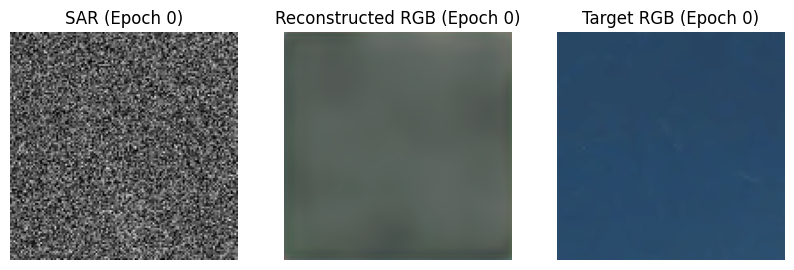

Epoch 1: 100%|████████████████████████████████████████████████████| 68/68 [02:08<00:00,  1.89s/batch, total_loss=0.532]


Epoch 1 | Loss: 1.2032 | Recon Loss: 0.0767 | KL Loss: 4.5059


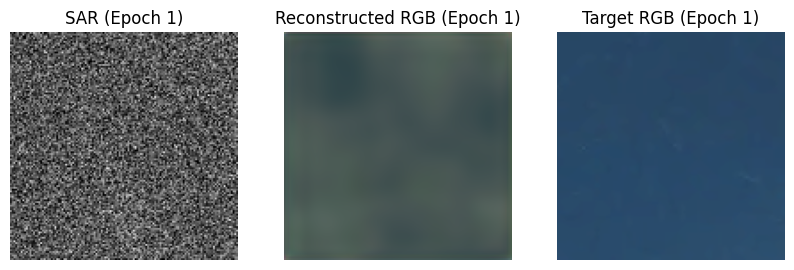

Epoch 2: 100%|████████████████████████████████████████████████████| 68/68 [02:09<00:00,  1.90s/batch, total_loss=0.294]


Epoch 2 | Loss: 0.4373 | Recon Loss: 0.0743 | KL Loss: 1.4521


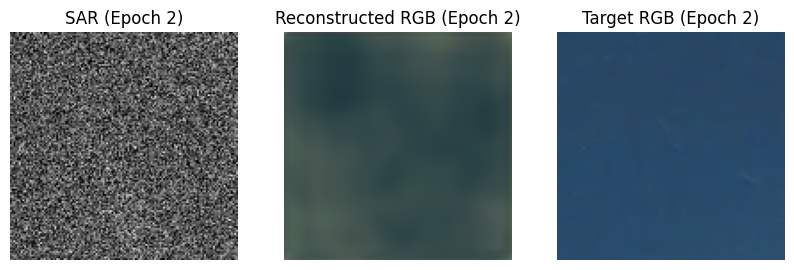

Epoch 3: 100%|████████████████████████████████████████████████████| 68/68 [02:08<00:00,  1.89s/batch, total_loss=0.309]


Epoch 3 | Loss: 0.3517 | Recon Loss: 0.0737 | KL Loss: 1.1121


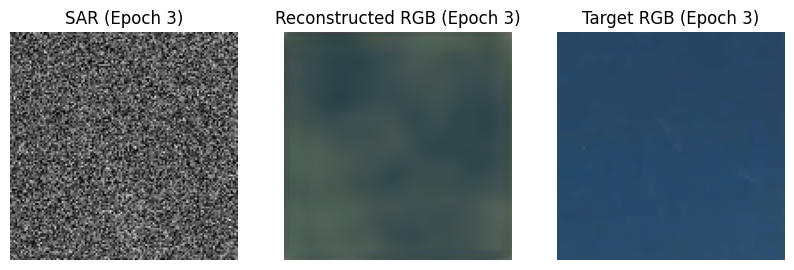

Epoch 4: 100%|█████████████████████████████████████████████████████| 68/68 [02:14<00:00,  1.97s/batch, total_loss=0.28]


Epoch 4 | Loss: 0.2895 | Recon Loss: 0.0723 | KL Loss: 0.8689


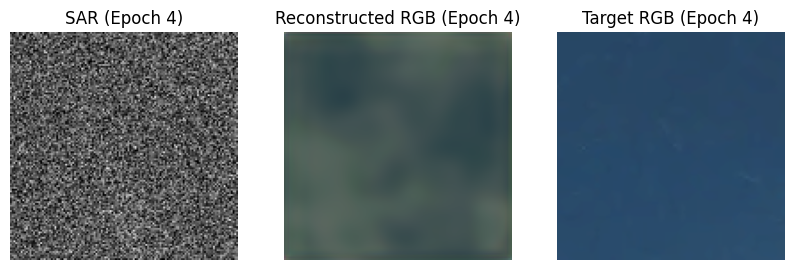

Epoch 5: 100%|████████████████████████████████████████████████████| 68/68 [02:08<00:00,  1.89s/batch, total_loss=0.376]


Epoch 5 | Loss: 0.2760 | Recon Loss: 0.0715 | KL Loss: 0.8183


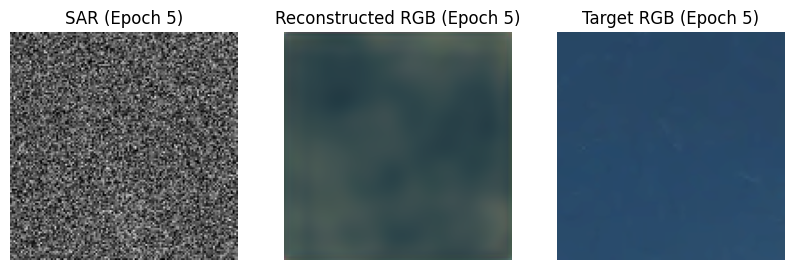

Epoch 6: 100%|████████████████████████████████████████████████████| 68/68 [02:08<00:00,  1.89s/batch, total_loss=0.196]


Epoch 6 | Loss: 0.2144 | Recon Loss: 0.0709 | KL Loss: 0.5737


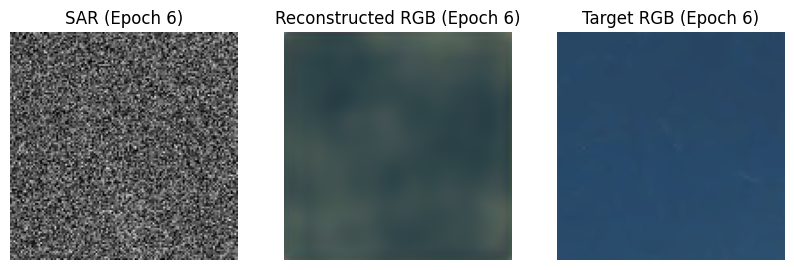

Epoch 7: 100%|████████████████████████████████████████████████████| 68/68 [02:09<00:00,  1.90s/batch, total_loss=0.232]


Epoch 7 | Loss: 0.2074 | Recon Loss: 0.0702 | KL Loss: 0.5488


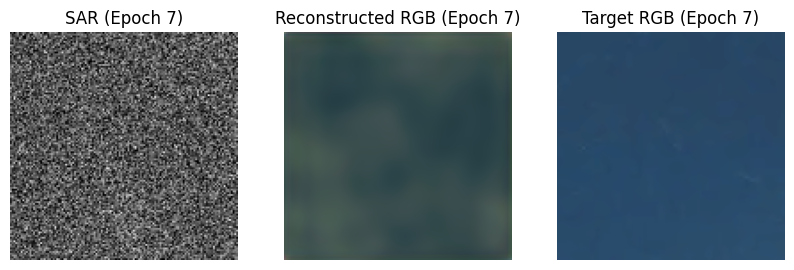

Epoch 8: 100%|████████████████████████████████████████████████████| 68/68 [02:08<00:00,  1.90s/batch, total_loss=0.297]


Epoch 8 | Loss: 0.2003 | Recon Loss: 0.0695 | KL Loss: 0.5235


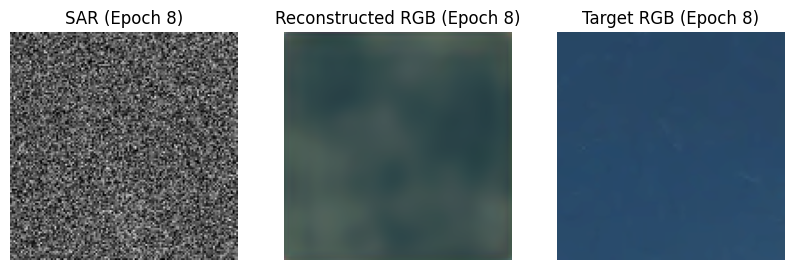

Epoch 9: 100%|████████████████████████████████████████████████████| 68/68 [02:09<00:00,  1.90s/batch, total_loss=0.168]


Epoch 9 | Loss: 0.1959 | Recon Loss: 0.0690 | KL Loss: 0.5079


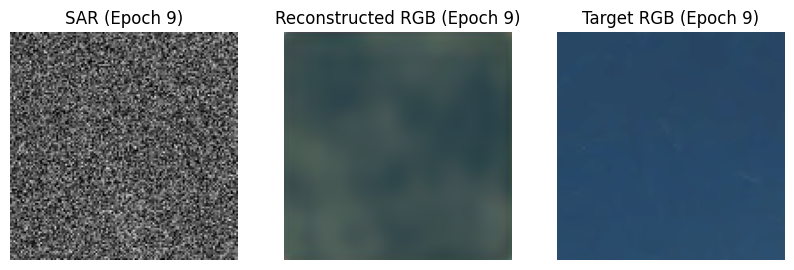

Epoch 10: 100%|███████████████████████████████████████████████████| 68/68 [02:11<00:00,  1.94s/batch, total_loss=0.141]


Epoch 10 | Loss: 0.1671 | Recon Loss: 0.0681 | KL Loss: 0.3956


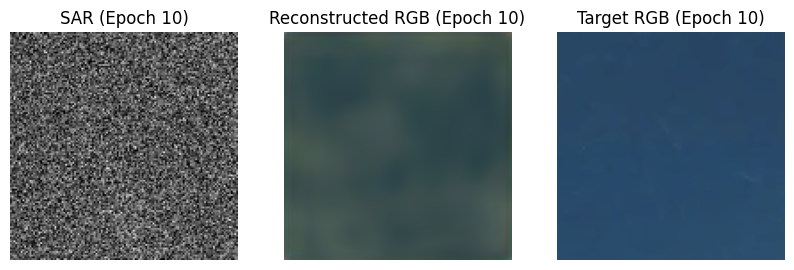

In [22]:
from datetime import datetime

BATCH_SIZE = 64
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True)

lr = 1e-5
optimizer = torch.optim.Adam(model.parameters(), lr=lr)
epochs = 10
beta=0.25
# best_model_path = f'unetplusplus_resnet50_ce_adamw_lr{lr:.0e}_bs{BATCH_SIZE}_512_noaug-{datetime.now().strftime("%Y_%m_%d")}.pth'
train(model, train_loader, optimizer, num_epochs=10, beta=beta)

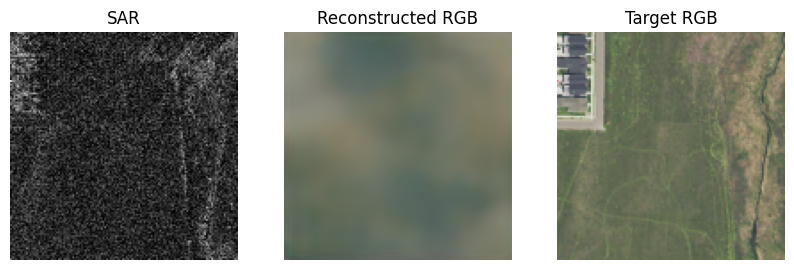

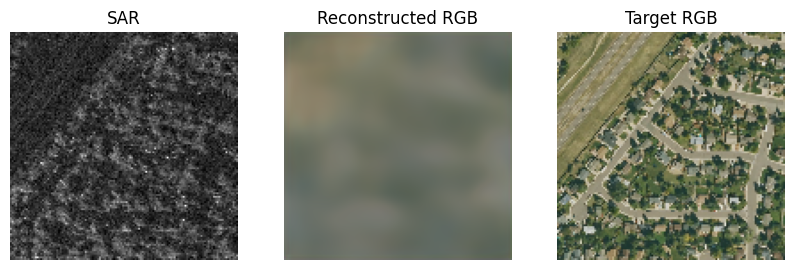

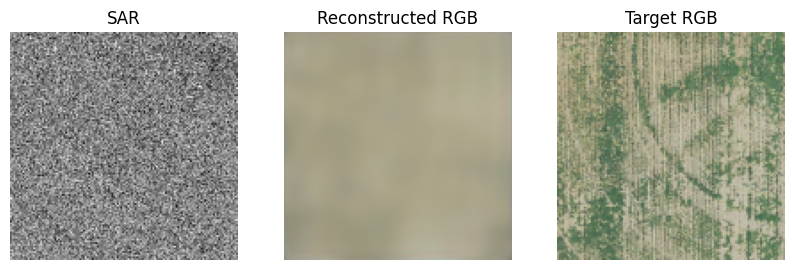

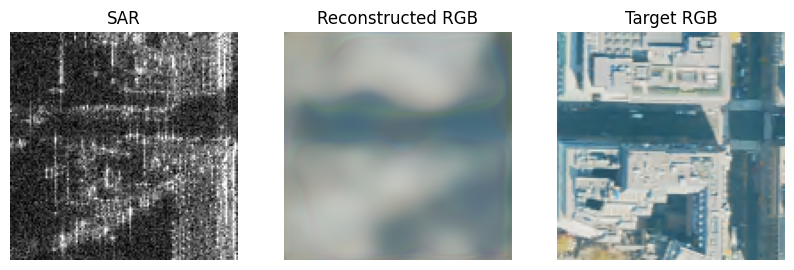

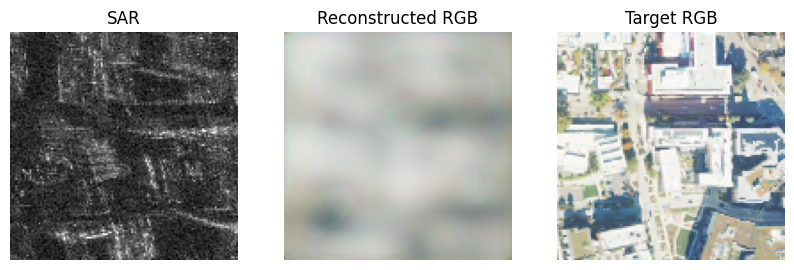

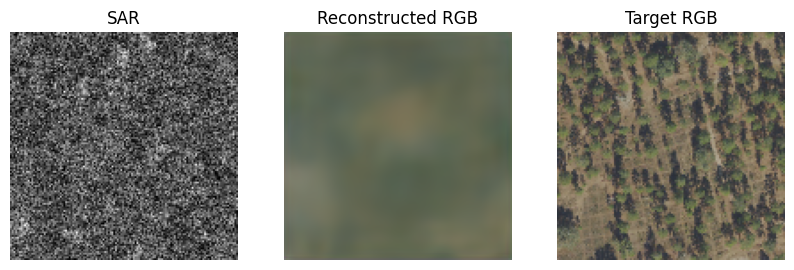

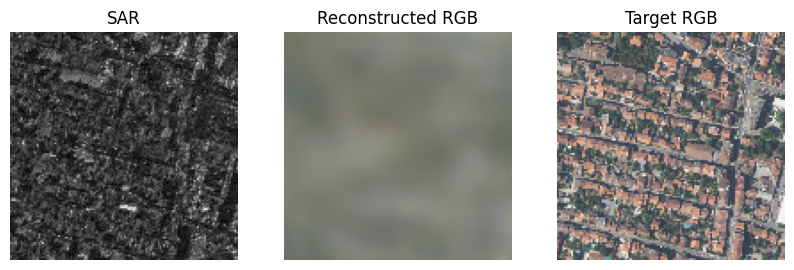

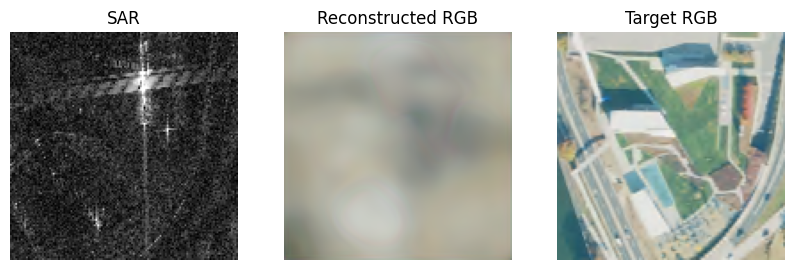

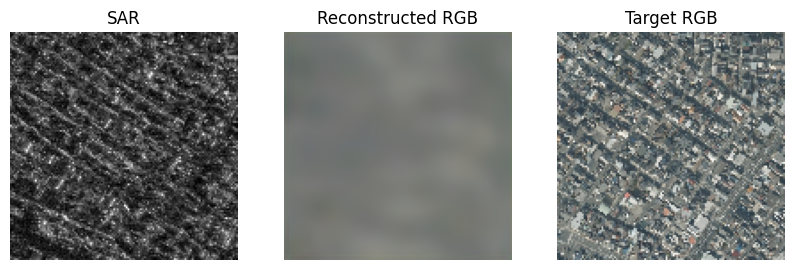

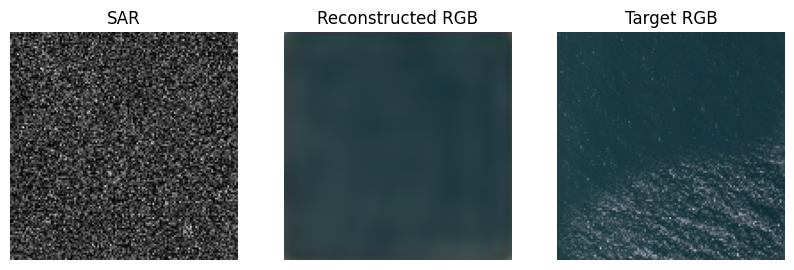

In [23]:
for i in range(10):
    random_idx = np.random.randint(0, len(train_dataset))
    random_sar, random_rgb = train_dataset[random_idx]
    random_sar = random_sar.unsqueeze(0).to(device)
    
    # Initial test step before training
    test_step(model, random_sar, random_rgb, show_plot=True)

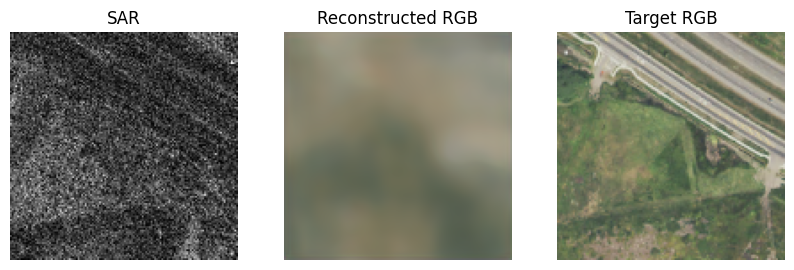

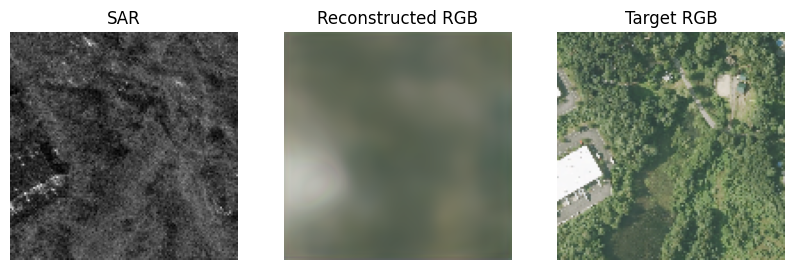

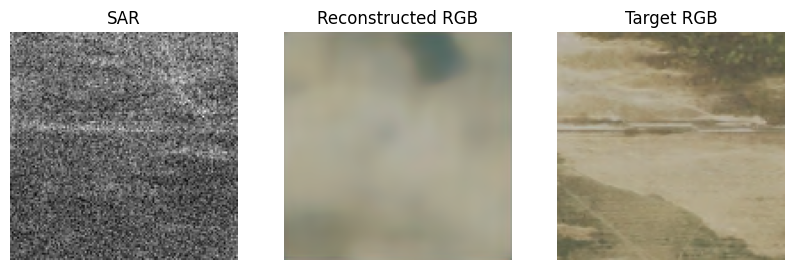

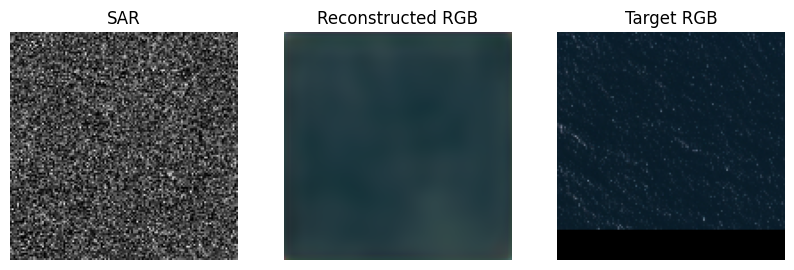

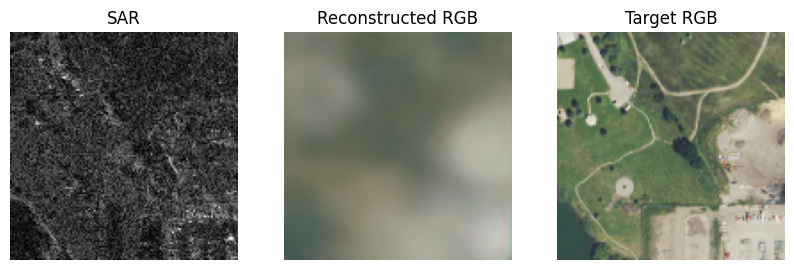

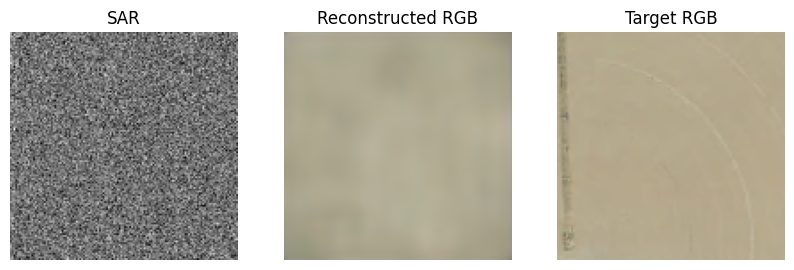

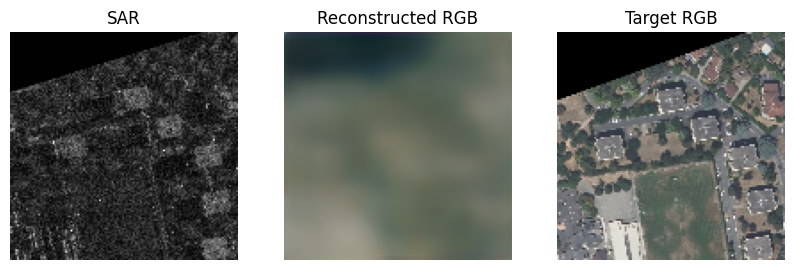

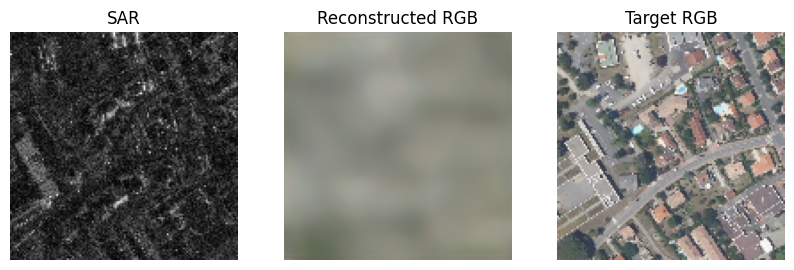

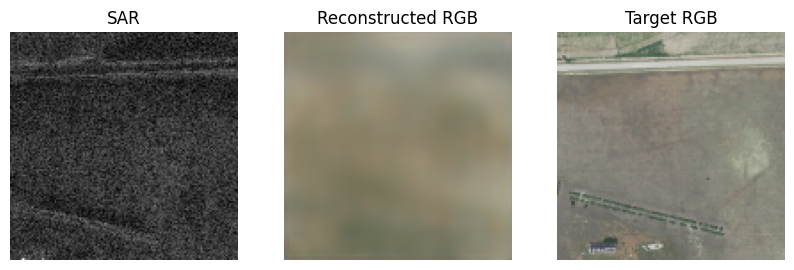

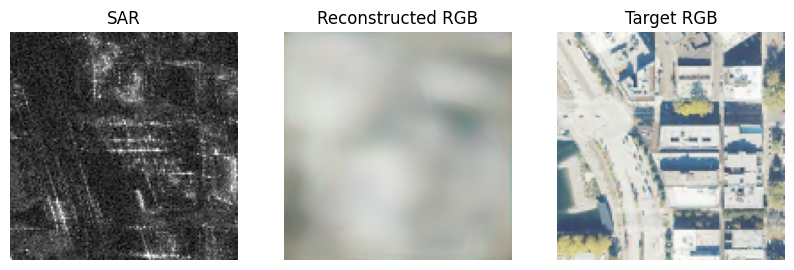

In [24]:
for i in range(10):
    random_idx = np.random.randint(0, len(train_dataset))
    random_sar, random_rgb = train_dataset[random_idx]
    random_sar = random_sar.unsqueeze(0).to(device)
    
    # Initial test step before training
    test_step(model, random_sar, random_rgb, show_plot=True)